In [1]:
import numpy as np
import cv2
import pickle
import glob
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed
from IPython.display import HTML
from moviepy.editor import VideoFileClip

In [2]:
cal_images= glob.glob("C:/Users/soumyama/Documents/Python Scripts/Autonomous Car/Advanced-Lane-Finding-Using-OpenCV/camera_cal/*.jpg")
test_images= glob.glob("C:/Users/soumyama/Documents/Python Scripts/Autonomous Car/Advanced-Lane-Finding-Using-OpenCV/test_images/*.jpg")

nx, ny= 9,6
objp= np.zeros((nx*ny, 3), np.float32)
objp[:,:2]= np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

In [3]:
def display(img1, img2, lbl1, lbl2, x, y, img3=[], lbl3=[], cmap=None, n = 2):
    """
    Diplay the input images side-by-side.
        Parameters:
            img1: Input image #1.
            img2: Input image #2.
            lbl1: Label for input image #1.
            lbl2: Label for input image #2.
            x, y: Figure size.
            cmap (Default = None): Used to display gray images.
    """
    plt.figure(figsize=(x, y))
    plt.subplot(1, n, 1)
    plt.imshow(img1, cmap = cmap)
    plt.xlabel(lbl1, fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, n, 2)
    plt.imshow(img2, cmap = cmap)
    plt.xlabel(lbl2, fontsize=15)
    plt.xticks([])
    plt.yticks([])
    if n == 3:
        plt.subplot(1, n, 3)
        plt.imshow(img3, cmap = cmap)
        plt.xlabel(lbl3, fontsize=15)
        plt.xticks([])
        plt.yticks([])
    plt.show()

In [4]:
def calibrate_camera(cal_images, nx, ny):
    """
    Compute camera calibration and return the camera intrinsic and extrinsic parameters.
        Parameters:
            cal_images: A list of the chessboard calibration images.
            nx, ny: Chessboard dimensions.
    """
    objpoints = []  # 3D points
    imgpoints = []  # 2D points
    
    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)

    for file in cal_images:
        img = cv2.imread(file)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    return mtx, dist

mtx, dist = calibrate_camera(cal_images, nx, ny)

In [5]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

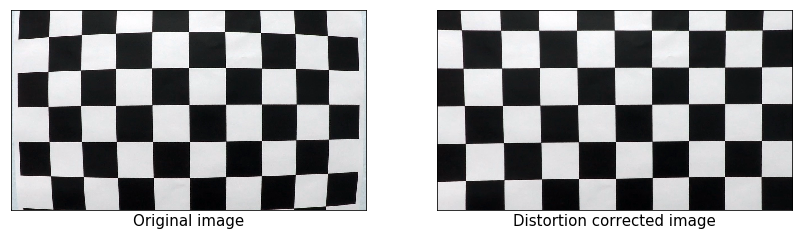

In [6]:
# Testing distortion correction on cal_images
img = cv2.imread(cal_images[0])
undist = undistort(img, mtx, dist)
display(img, undist, 'Original image', 'Distortion corrected image', 14, 7)

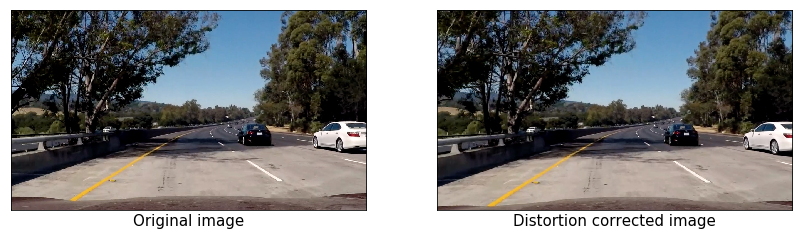

In [7]:
# Testing distortion correction on test_images
img = cv2.cvtColor(cv2.imread(test_images[6]), cv2.COLOR_BGR2RGB)
undist_img_ex = undistort(img, mtx, dist)
display(img, undist_img_ex, 'Original image', 'Distortion corrected image', 14, 7)

In [8]:
# Define the region of interest
src = np.float32([[190, 700], [1110, 700], [720, 470], [570, 470]])

bottom_left = src[0][0]+100, src[0][1]
bottom_right = src[1][0]-200, src[1][1]
top_left = src[3][0]-250, 1
top_right = src[2][0]+200, 1
dst = np.float32([bottom_left, bottom_right, top_right, top_left])

In [9]:
def perspective_transform(img, src, dst):
    """
     Convert the vehicle’s camera view of the scene into a top-down “bird’s-eye” view.
        Parameters:
            img: Input image.
            src: Source points.
            dst: Destination points.
    """
    image_shape = img.shape
    img_size = (image_shape[1], image_shape[0])
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, M, img_size)
    # Return the resulting image and matrix
    return warped, M, Minv

In [10]:
undist_example_warped = perspective_transform(undist_img_ex, src, dst)[0]

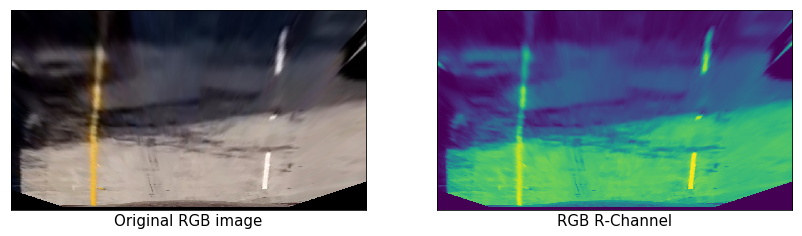

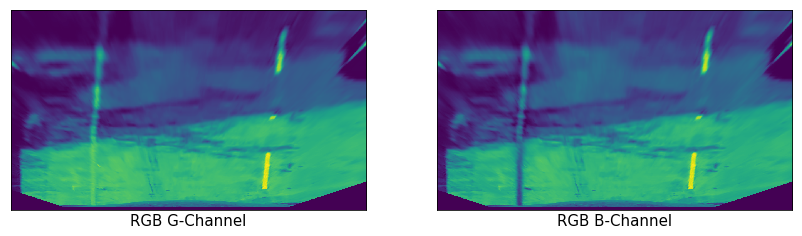

In [11]:
undist_example_RGB = undist_example_warped
undist_example_R = undist_example_RGB[:,:,0]
undist_example_G = undist_example_RGB[:,:,1]
undist_example_B = undist_example_RGB[:,:,2]

display(undist_example_RGB, undist_example_R, 'Original RGB image', 'RGB R-Channel', 14, 7)
display(undist_example_G, undist_example_B, 'RGB G-Channel', 'RGB B-Channel', 14, 7)

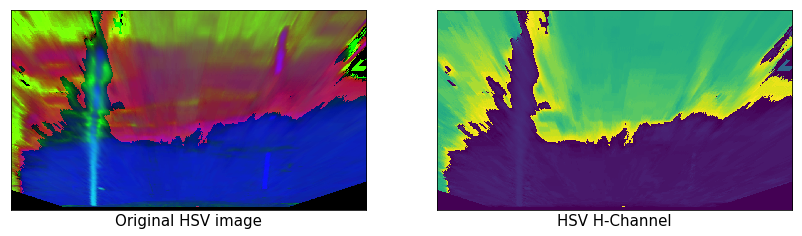

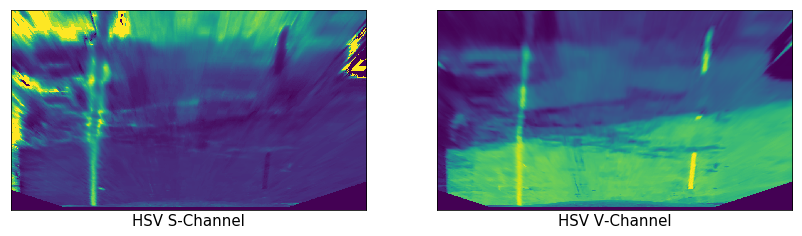

In [12]:
undist_example_HSV = cv2.cvtColor(undist_example_RGB, cv2.COLOR_RGB2HSV)
undist_example_HSV_H = undist_example_HSV[:,:,0]
undist_example_HSV_S = undist_example_HSV[:,:,1]
undist_example_HSV_V = undist_example_HSV[:,:,2]

display(undist_example_HSV, undist_example_HSV_H, 'Original HSV image', 'HSV H-Channel', 14, 7)
display(undist_example_HSV_S, undist_example_HSV_V, 'HSV S-Channel', 'HSV V-Channel', 14, 7)

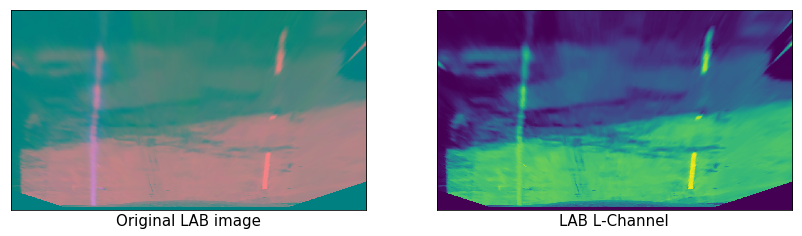

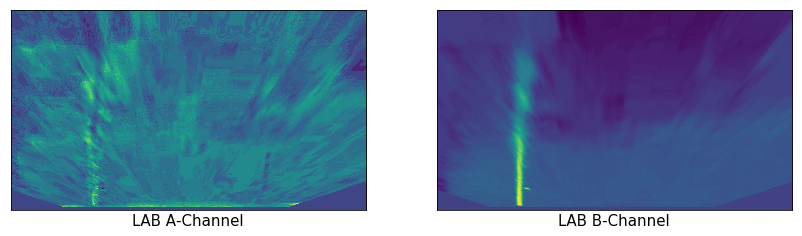

In [13]:
undist_example_LAB = cv2.cvtColor(undist_example_RGB, cv2.COLOR_RGB2Lab)
undist_example_LAB_L = undist_example_LAB[:,:,0]
undist_example_LAB_A = undist_example_LAB[:,:,1]
undist_example_LAB_B = undist_example_LAB[:,:,2]

display(undist_example_LAB, undist_example_LAB_L, 'Original LAB image', 'LAB L-Channel', 14, 7)
display(undist_example_LAB_A, undist_example_LAB_B, 'LAB A-Channel', 'LAB B-Channel', 14, 7)

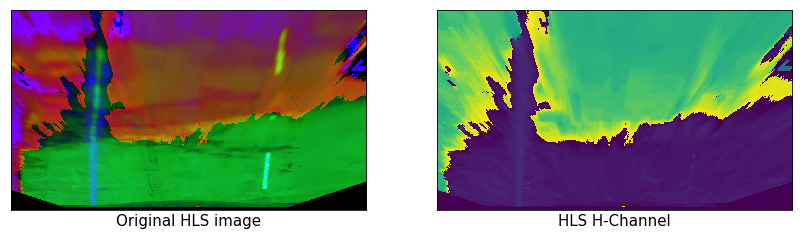

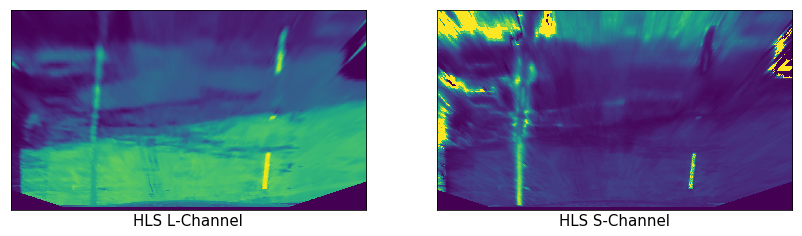

In [14]:
undist_example_HLS = cv2.cvtColor(undist_example_RGB, cv2.COLOR_RGB2HLS)
undist_example_HLS_H = undist_example_HLS[:,:,0]
undist_example_HLS_L = undist_example_HLS[:,:,1]
undist_example_HLS_S = undist_example_HLS[:,:,2]

display(undist_example_HLS, undist_example_HLS_H, 'Original HLS image', 'HLS H-Channel', 14, 7)
display(undist_example_HLS_L, undist_example_HLS_S, 'HLS L-Channel', 'HLS S-Channel', 14, 7)

In [15]:
def hls_l_thresh(img, thresh=(220, 255)):
    """
     Threshold the input image to the L-channel of the HLS color space.
        Parameters:
            img: HLS image.
            thresh: Minimum and Maximum color intensity.
    """
    img = img[:,:,1]
    img = img*(255/np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

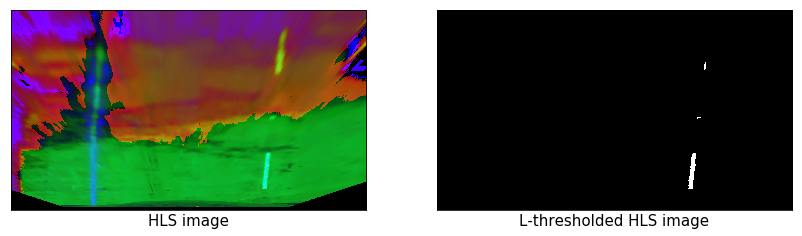

In [16]:
thresh_HLS = hls_l_thresh(undist_example_HLS)
display(undist_example_HLS, thresh_HLS, 'HLS image', 'L-thresholded HLS image', 14, 7, cmap = 'gray')

In [17]:
def lab_b_thresh(img, thresh=(190, 255)):
    """
     Threshold the input image to the B-channel of the LAB color space.
        Parameters:
            img: LAB image.
            thresh: Minimum and Maximum color intensity.
    """
    img = img[:,:,2]
    if np.max(img) > 175:
        img = img*(255/np.max(img))
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

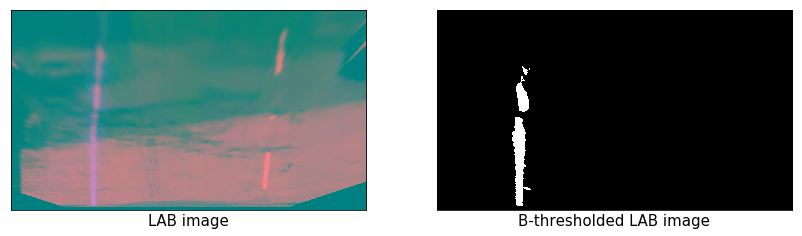

In [18]:
thresh_LAB = lab_b_thresh(undist_example_LAB)
display(undist_example_LAB, thresh_LAB, 'LAB image', 'B-thresholded LAB image', 14, 7, cmap = 'gray')

In [19]:
def threshold_color_space(img):
    img_HLS= cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    img_LAB= cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    img_thresh_HLS= hls_l_thresh(img_HLS)
    img_thresh_LAB= lab_b_thresh(img_LAB)
    combined_img= np.zeros_like(img_thresh_HLS)
    combined_img[((img_thresh_HLS==1) | (img_thresh_LAB==1))]=1
    return combined_img

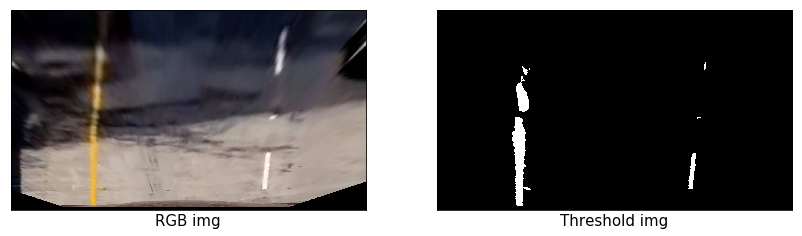

In [20]:
threshold_color_img= threshold_color_space(undist_example_warped)
display(undist_example_warped, threshold_color_img, "RGB img", "Threshold img", 14, 7, cmap='gray')

### Sobel Differentiation

In [21]:
def abs_sobel(img, orient='x', sobel_kernel=3, thresh=(25, 255)):
    
    sobel= cv2.Sobel(img, cv2.CV_64F, orient=='x', orient=='y', ksize=sobel_kernel)
    abs_sobel= np.absolute(sobel)
    scaled_sobel= np.uint8(255*abs_sobel/np.max(abs_sobel))
    sxbinary= np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel<= thresh[1])]=1
    return sxbinary

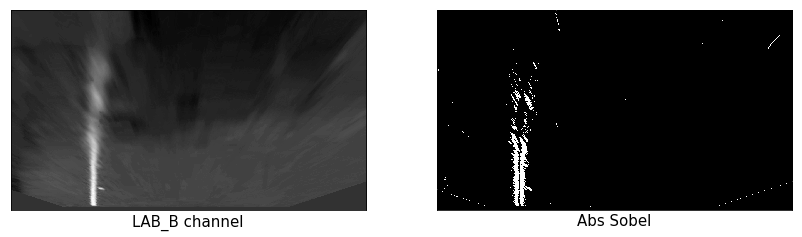

In [22]:
# LAP B

abs_sobel_example_LAB_B= abs_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, abs_sobel_example_LAB_B, 'LAB_B channel', 'Abs Sobel', 14, 7, cmap='gray')

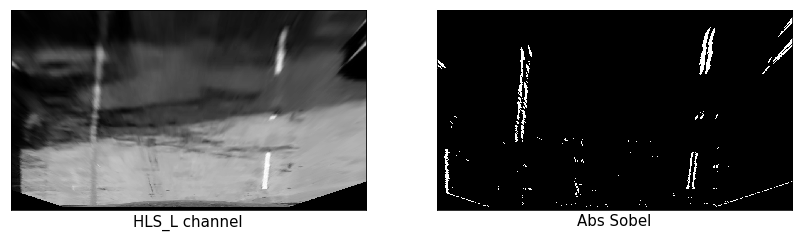

In [23]:
# HSL L

abs_sobel_example_HLS_L= abs_sobel(undist_example_HLS_L)
display(undist_example_HLS_L, abs_sobel_example_HLS_L, 'HLS_L channel', 'Abs Sobel', 14, 7, cmap='gray')

In [24]:
def mag_sobel(img, sobel_kernel=15, thresh=(25, 255)):
    
    sobelx= cv2.Sobel(img, cv2.CV_64F, 1,0, ksize=sobel_kernel)
    sobely= cv2.Sobel(img, cv2.CV_64F, 0,1, ksize=sobel_kernel)
    mag_sobel= np.sqrt(np.square(sobelx) + np.square(sobely))
    scaled_sobel= np.uint8(255*mag_sobel/np.max(mag_sobel))
    sxbinary= np.zeros_like(scaled_sobel)
    sxbinary[((scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1]))]= 1
    return sxbinary

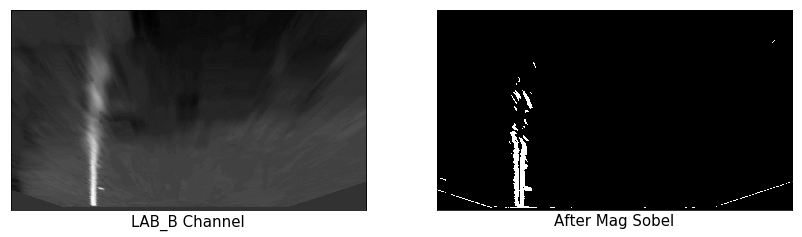

In [25]:
mag_sobel_example_LAB_B= mag_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, mag_sobel_example_LAB_B, 'LAB_B Channel', 'After Mag Sobel', 14, 7, cmap='gray')

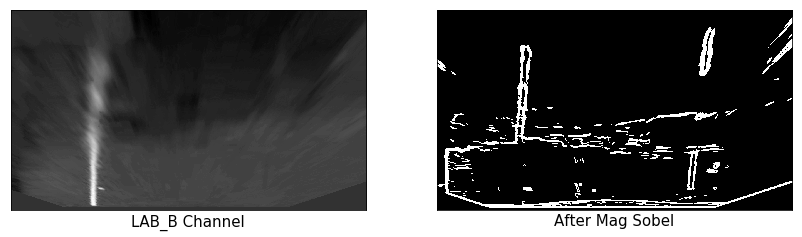

In [26]:
mag_sobel_example_HLS_L= mag_sobel(undist_example_HLS_L)
display(undist_example_LAB_B, mag_sobel_example_HLS_L, 'LAB_B Channel', 'After Mag Sobel', 14, 7, cmap='gray')

In [27]:
def dir_sobel(img, sobel_kernel=25, thresh=(0.0, 0.09)):
    
    sobelx= cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely= cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    abs_sobelx= np.absolute(sobelx)
    abs_sobely= np.absolute(sobely)
    grad_dir= np.arctan2(abs_sobely, abs_sobelx)
    binary_output= np.zeros_like(grad_dir)
    binary_output[((grad_dir>= thresh[0]) & (grad_dir <= thresh[1]))] =1
    return binary_output

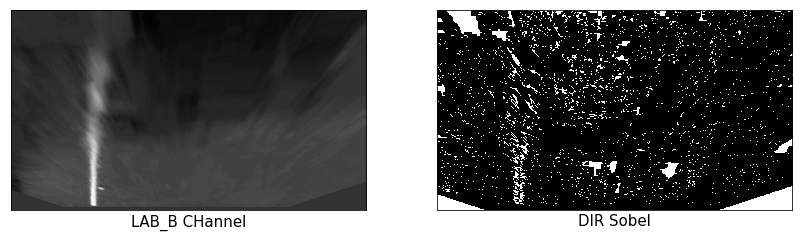

In [28]:
dir_sobel_example_LAB_B= dir_sobel(undist_example_LAB_B)
display(undist_example_LAB_B, dir_sobel_example_LAB_B, 'LAB_B CHannel', 'DIR Sobel', 14, 7, cmap='gray')

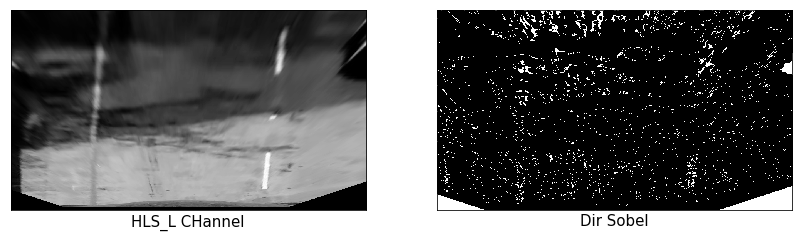

In [29]:
dir_sobel_example_HLS_L= dir_sobel(undist_example_HLS_L)
display(undist_example_HLS_L, dir_sobel_example_HLS_L, 'HLS_L CHannel', 'Dir Sobel', 14, 7, cmap='gray')

In [30]:
def combined_sobel(img, mag_kernel_size, mag_thresh):
    
    img_abs= abs_sobel(img)
    img_mag= mag_sobel(img, mag_kernel_size, mag_thresh)
    combined_img= np.zeros_like(img_mag)
    combined_img[((img_abs==1) & (img_mag==1))]=1
    return combined_img

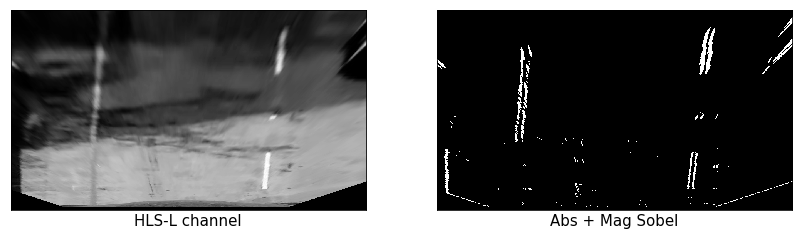

In [31]:
combined_HLS_L= combined_sobel(undist_example_HLS_L, 15, (25, 255))
display(undist_example_HLS_L, combined_HLS_L, 'HLS-L channel', 'Abs + Mag Sobel', 14, 7, cmap='gray')

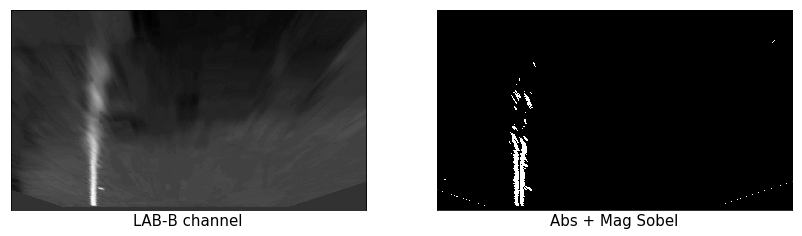

In [32]:
combined_LAB_B= combined_sobel(undist_example_LAB_B, 15, (25, 255))
display(undist_example_LAB_B, combined_LAB_B, 'LAB-B channel', 'Abs + Mag Sobel', 14, 7, cmap='gray')

In [33]:
def combined_sobel_colors(img, mag_kernel_size, mag_thresh):
    
    img_HLS= cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    img_LAB= cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    combined_HLS_L= combined_sobel(img_HLS[:,:,1], mag_kernel_size, mag_thresh)
    combined_LAB_B= combined_sobel(img_LAB[:,:,2], mag_kernel_size, mag_thresh)
    combined_sobel_colors_img= np.zeros_like(combined_HLS_L)
    combined_sobel_colors_img[((combined_HLS_L==1) | (combined_LAB_B==1))] = 1
    return combined_sobel_colors_img

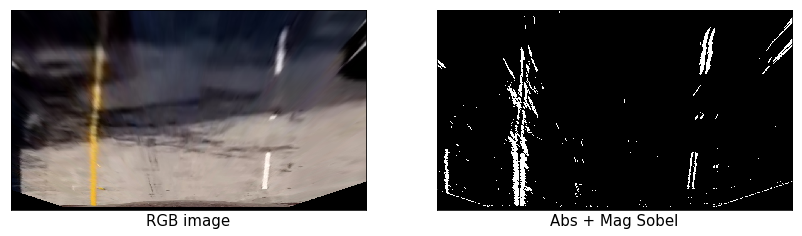

In [34]:
combined_sobel_colors_img = combined_sobel_colors(undist_example_RGB, 15, (25, 225))
display(undist_example_RGB, combined_sobel_colors_img, 'RGB image', 'Abs + Mag Sobel', 14, 7, cmap='gray')

### Color Thresholding vs Sobel Differentiation

In [35]:
color_threshold=[]
sobel_diff=[]
test_images_warped=[]
for file in test_images:
    image= cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    image= undistort(image, mtx, dist)
    image= perspective_transform(image, src, dst)[0]
    test_images_warped.append(image)
    color_threshold.append(threshold_color_space(image))
    sobel_diff.append(combined_sobel_colors(image, 15, (25,255)))

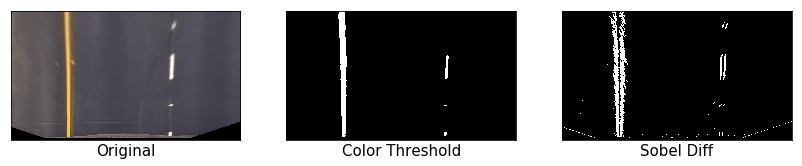

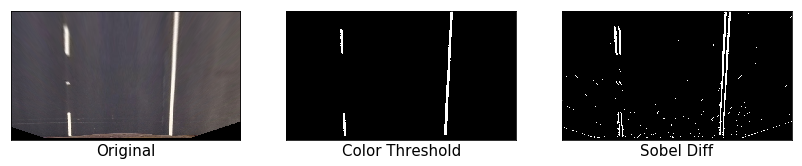

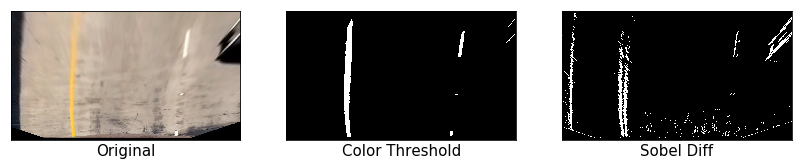

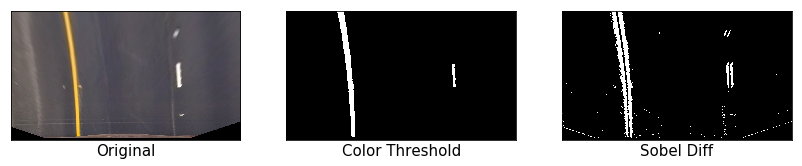

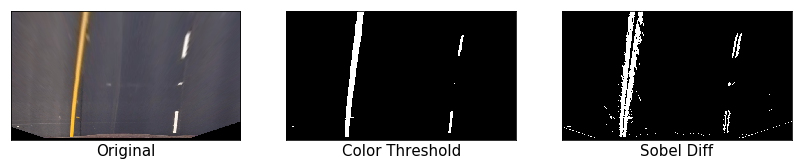

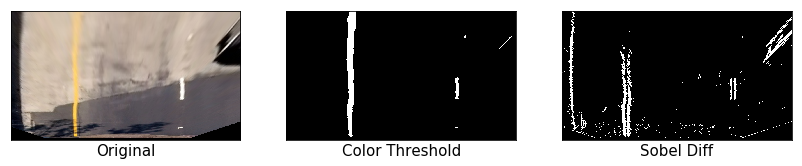

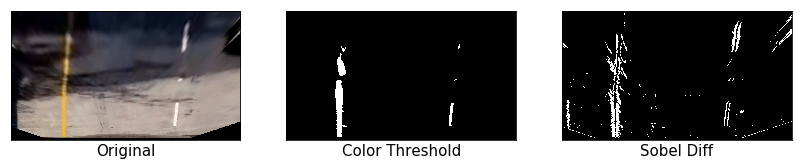

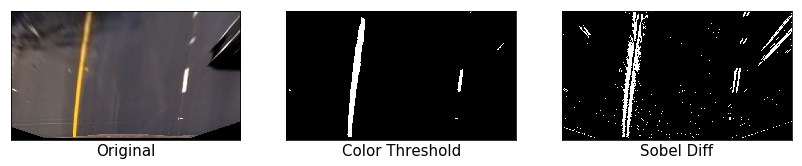

In [36]:
for original, color, sobel in zip(test_images_warped, color_threshold, sobel_diff):
    display(original, color, 'Original', 'Color Threshold', 14, 7, sobel, 'Sobel Diff', cmap='gray', n=3)

### Image Processing Pipe Line

In [37]:
def image_process(img):
    
    img= undistort(img, mtx, dist)
    img, M, Minv= perspective_transform(img, src, dst)
    img= threshold_color_space(img)
    
    return img, Minv

In [38]:
test_images_imgs=[]
test_images_processed=[]
for file in test_images:
    image= cv2.cvtColor(cv2.imread(file), cv2.COLOR_BGR2RGB)
    test_images_imgs.append(image)
    image, Minv= image_process(image)
    test_images_processed.append(image)

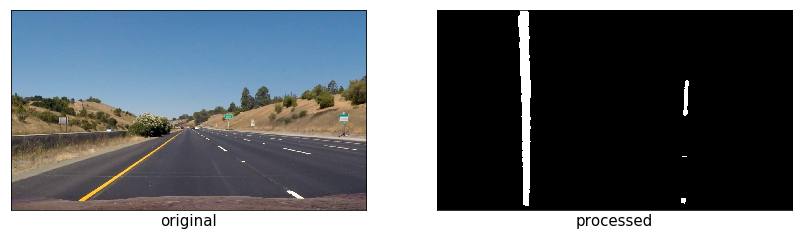

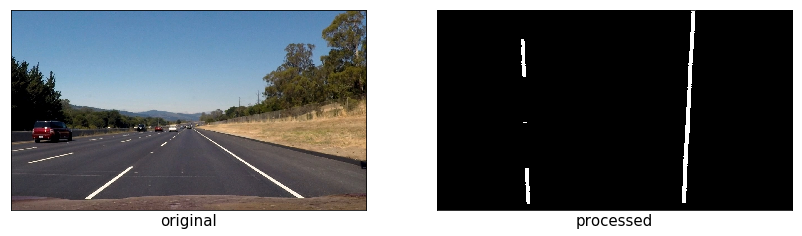

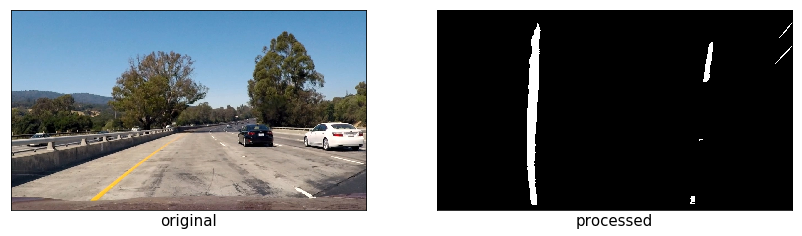

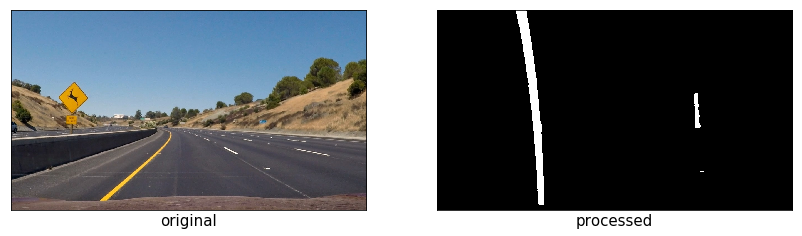

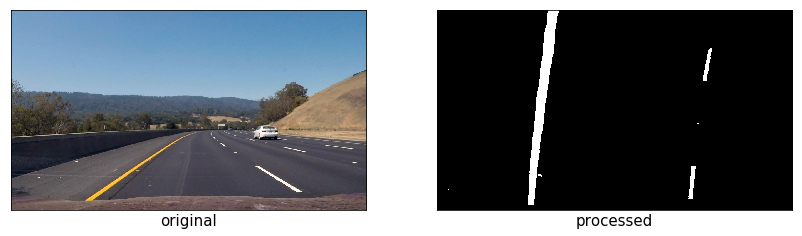

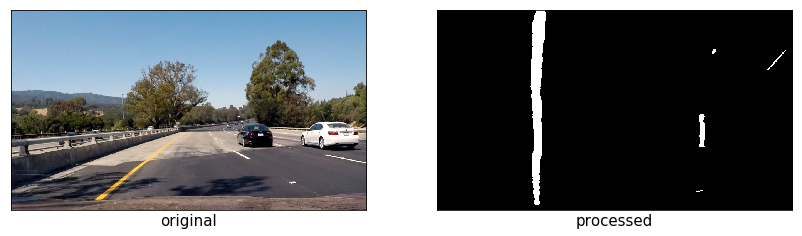

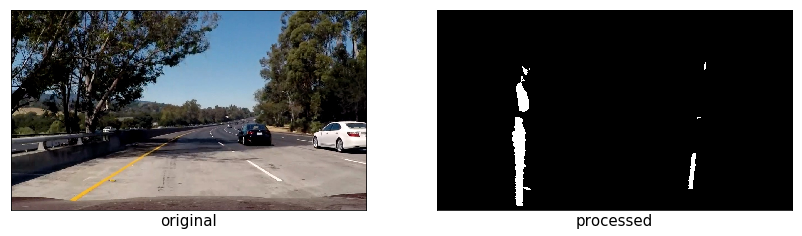

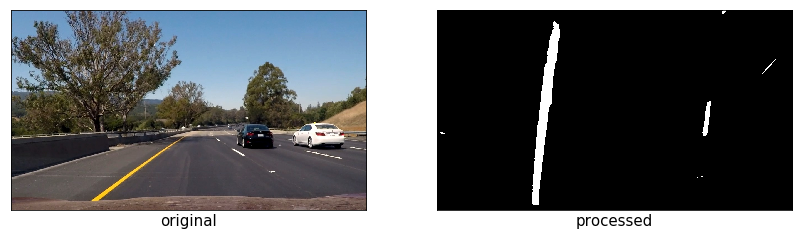

In [39]:
for original, processed in zip(test_images_imgs, test_images_processed):
    display(original, processed, 'original', 'processed', 14, 7, cmap='gray')

### Detect Lane Lines
 - Sliding Window

In [40]:
def sliding_window(img):
    
    #histogram of bottom half of img
    histogram= np.sum(img[img.shape[0]//2:,:], axis=0)
    #Find peak of left and right halves of histogram - which will provide staring point for left and right lines
    midpoint= np.int(histogram.shape[0]//2)
    quarter_point= np.int(midpoint//2)
    
    #Previously the left/right base was the max of the left/right half of the histogram this changes it so that 
    #only a quarter of the histogram (directly to the left/right) is considered
    leftx_base= np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base= np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
    
    #Choose the number of sliding windows
    n_windows=50
    #set height of windows
    window_height= np.int(img.shape[0]/n_windows)
    
    #Identify the position of x and y of all non-zero pixels in the image
    nonzero=img.nonzero()
    nonzerox= np.array(nonzero[1])
    nonzeroy= np.array(nonzero[0])
    
    #Current position to be updated for each window
    leftx_current= leftx_base
    rightx_current= rightx_base
    
    #set width of window margin
    margin=80
    
    #Min number of pixel to recenter window
    min_pix= 40
    
    #Create empty list to receive left and right lane pixel indices
    left_lane_inds=[]
    right_lane_inds=[]
    
    #Rectangle data for visualization
    rectangle_data=[]
    
    #Step through the windows one by one
    for window in range(n_windows):
        #identify window boundaries in  x and y (and right and left)
        win_y_low= img.shape[0] - (window+1)*window_height
        win_y_high= img.shape[0] - window*window_height
        win_xleft_low= leftx_current- margin
        win_xleft_high= leftx_current+ margin
        win_xright_low= rightx_current- margin
        win_xright_high= rightx_current+ margin
        
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        
        #Identify the nonzero pixels in x and y within window
        good_left_inds= ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                         (nonzerox>= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        
        good_right_inds= ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                         (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        #Append the indices to a list
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If we find > min_pix pixels, recenter recenter the window on their mean position
        if len(good_left_inds) > min_pix:
            leftx_current= np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > min_pix:
            rightx_current= np.int(np.mean(nonzerox[good_right_inds]))
            
    #Concatenate the arrays of indices
    left_lane_inds= np.concatenate(left_lane_inds)
    right_lane_inds= np.concatenate(right_lane_inds)
    
    #Extract left and right line pixel positions
    leftx= nonzerox[left_lane_inds]
    lefty= nonzeroy[left_lane_inds]
    rightx= nonzerox[right_lane_inds]
    righty= nonzeroy[right_lane_inds]
    
    left_fit, right_fit= (None, None)
    #Fit a 2nd order polynomial to each
    if len(leftx) !=0:
        left_fit= np.polyfit(lefty, leftx, 2)
    if len(rightx) !=0:
        right_fit= np.polyfit(righty, rightx, 2)
        
    visualisation_data= (rectangle_data, histogram)
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data

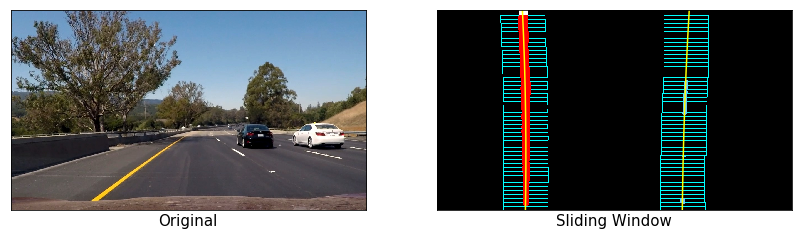

In [41]:
#Visualise the sliding windows over an example test image

img= test_images_processed[0]
left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data= sliding_window(img)
h= img.shape[0]
left_fit_x_int= left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int= right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
rectangles= visualisation_data[0]
histogram= visualisation_data[1]

#Create an o/p image to draw and visualise the result
out_img= np.uint8(np.dstack((img, img, img))*255)

#Generate x and y values for plotting
ploty= np.linspace(0, img.shape[0]-1, img.shape[0])
left_fitx= left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx= right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

for rect in rectangles:
    #Draw the windows on visualisation image
    cv2.rectangle(out_img, (rect[2], rect[0]), (rect[3], rect[1]), (0, 255,255), 2)
    cv2.rectangle(out_img, (rect[4], rect[0]), (rect[5], rect[1]), (0, 255,255), 2)

#Identify the x and y positions of all nonzero pixels in the image
nonzero= img.nonzero()
nonzerox= np.array(nonzero[1])
nonzeroy= np.array(nonzero[0])

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]]= [100,200,255]
plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.imshow(original)
plt.xlabel('Original', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(out_img)
plt.xlabel('Sliding Window', fontsize=15)
plt.plot(left_fitx, ploty, color="yellow")
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.show()

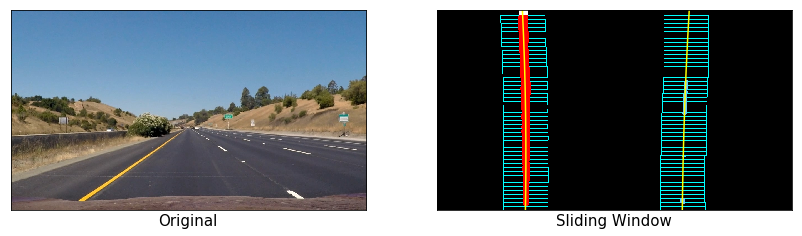

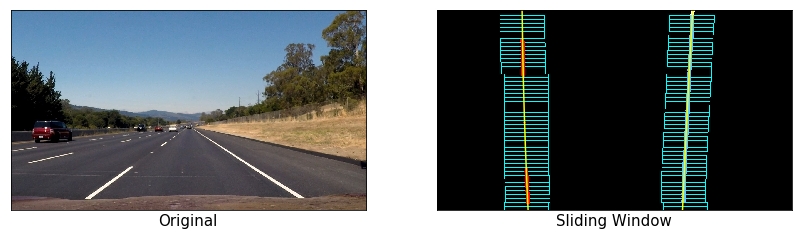

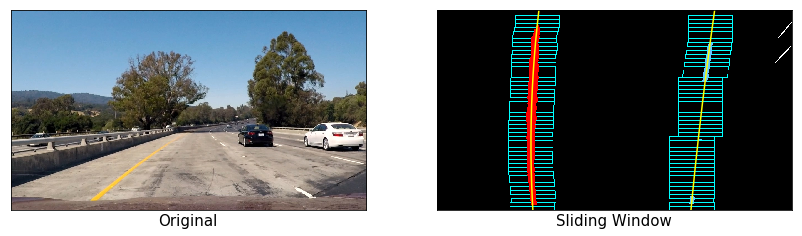

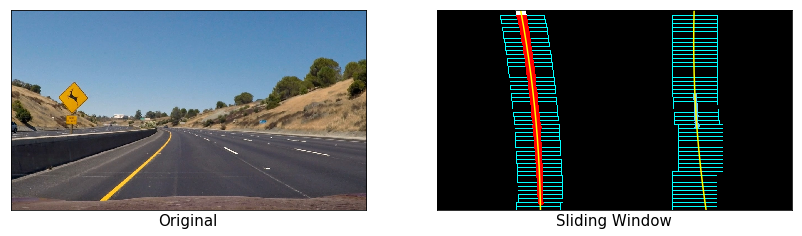

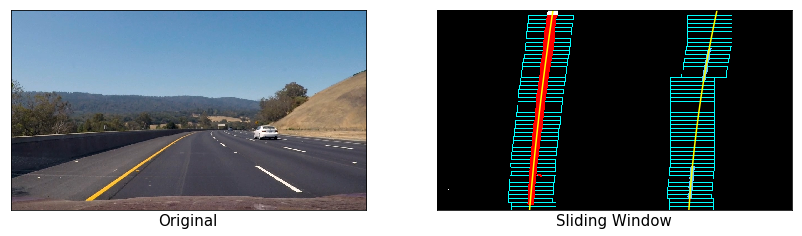

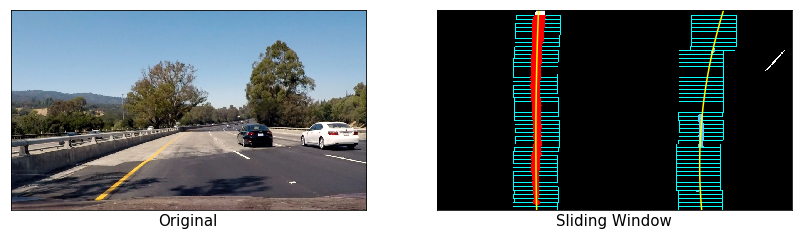

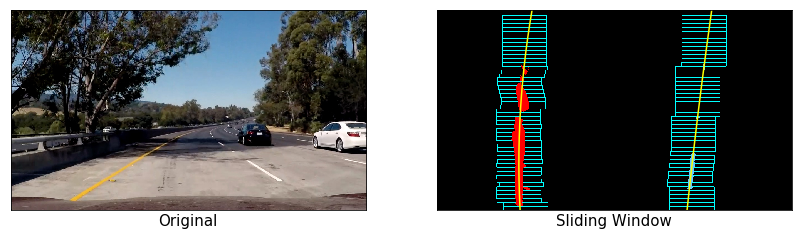

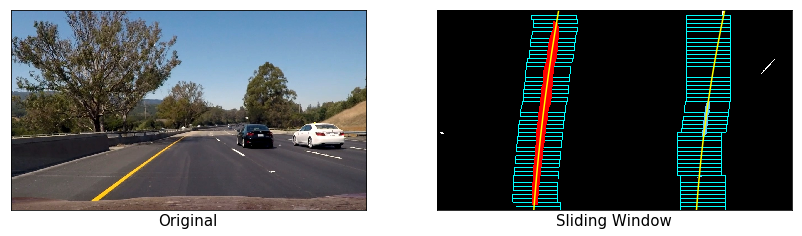

In [42]:
#Visualise the sliding windows on the test images

for original, processed in zip(test_images_imgs, test_images_processed):
    img= processed
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data= sliding_window(img)
    h= img.shape[0]
    left_fit_x_int= left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    right_fit_x_int= right_fit[0]*h**2 + left_fit[1]*h +left_fit[2]
    rectangles= visualisation_data[0]
    histogram= visualisation_data[1]
    #Create an  o/p image to draw and visualise results 
    out_img= np.uint8(np.dstack((img, img, img))*255)
    #Generate x and y values for plotting
    ploty= np.linspace(0, img.shape[0]-1, img.shape[0])
    left_fitx= left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx= right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangles:
        #Draw windows visualisation on image
        cv2.rectangle(out_img, (rect[2], rect[0]), (rect[3], rect[1]), (0, 255, 255), 2)
        cv2.rectangle(out_img, (rect[4], rect[0]), (rect[5], rect[1]), (0, 255, 255), 2)
    
    # Identify the x and y positions of all non-zero pixels in image
    nonzero= img.nonzero()
    nonzerox= nonzero[1]
    nonzeroy= nonzero[0]
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255,0,0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]]= [100, 200, 255]
    plt.figure(figsize=(14,7))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.xlabel('Original', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,2,2)
    plt.imshow(out_img)
    plt.xlabel('Sliding Window', fontsize=15)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720,0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

- Polyfit Using Previous Frame

In [43]:
def polyfit_prev_fit(img, left_fit_prev, right_fit_prev):
    
    nonzero= img.nonzero()
    nonzerox= np.array(nonzero[1])
    nonzeroy= np.array(nonzero[0])
    margin=80
    
    left_lane_inds= ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] - margin))
                    & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin)))
    
    right_lane_inds= ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] - margin))
                    & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))
    
    leftx= nonzerox[left_lane_inds]
    lefty= nonzeroy[left_lane_inds]
    rightx= nonzerox[right_lane_inds]
    righty= nonzeroy[right_lane_inds]
    left_fit_new, right_fit_new= (None, None)
    if len(leftx) != 0:
        left_fit_new= np.polyfit(lefty, leftx, 2)
    if len(rightx) !=0:
        right_fit_new= np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds

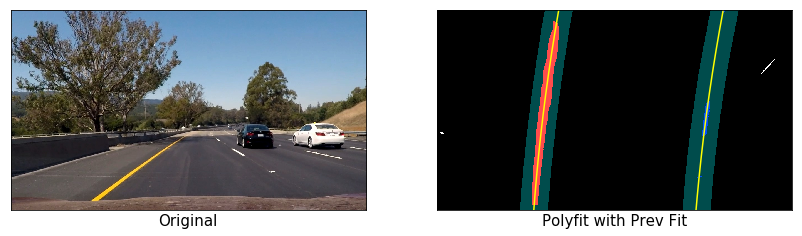

In [44]:
#Visualise poly_fit_prev_fit on an example image

margin=50
left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data= sliding_window(img)
left_fit2, right_fit2, left_lane_inds2, right_lane_inds2= polyfit_prev_fit(img, left_fit, right_fit)
ploty= np.linspace(0, img.shape[0]-1, img.shape[0])
left_fitx= left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx= right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

left_fitx2= left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
right_fitx2= right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
out_img= np.uint8(np.dstack((img,img,img))*255)
window_img= np.zeros_like(out_img)
nonzero= img.nonzero()
nonzerox= np.array(nonzero[1])
nonzeroy= np.array(nonzero[0])
out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]]= [255,0,0]
out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]]= [0,0,255]

left_line_window1= np.array([np.transpose(np.vstack([left_fitx - margin, ploty]))])
left_line_window2= np.array([np.flipud(np.transpose(np.vstack([left_fitx + margin, ploty])))])
left_line_pts= np.hstack((left_line_window1, left_line_window2))

right_line_window1= np.array([np.transpose(np.vstack([right_fitx - margin, ploty]))])
right_line_window2= np.array([np.flipud(np.transpose(np.vstack([right_fitx + margin, ploty])))])
right_line_pts= np.hstack((right_line_window1, right_line_window2))

cv2.fillPoly(window_img, np.int_([left_line_pts]), (0, 255, 255))
cv2.fillPoly(window_img,  np.int_([right_line_pts]), (0, 255, 255))

result= cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

plt.figure(figsize=(14,7))
plt.subplot(1,2,1)
plt.imshow(original)
plt.xlabel('Original', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(result)
plt.xlabel('Polyfit with Prev Fit', fontsize=15)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720,0)
plt.xticks([])
plt.yticks([])
plt.show()

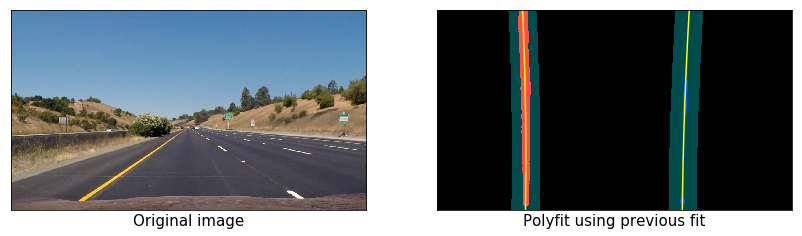

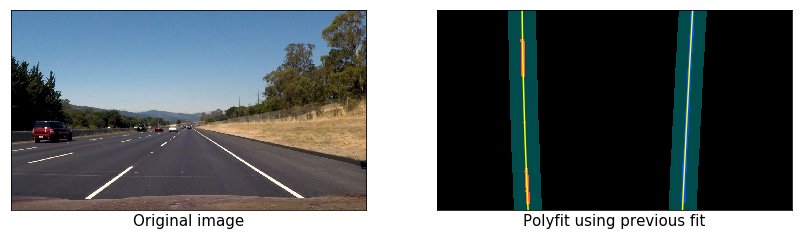

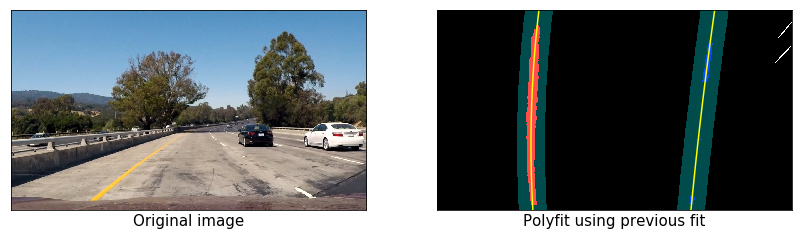

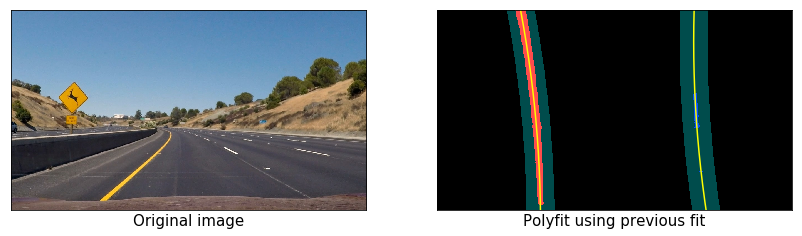

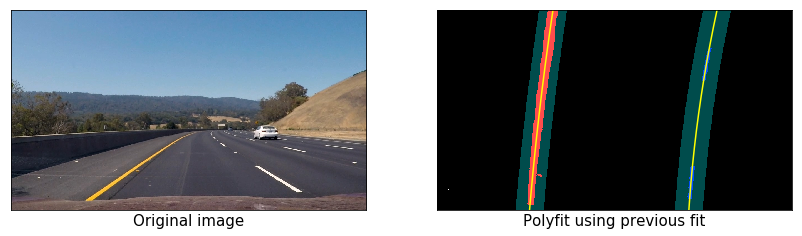

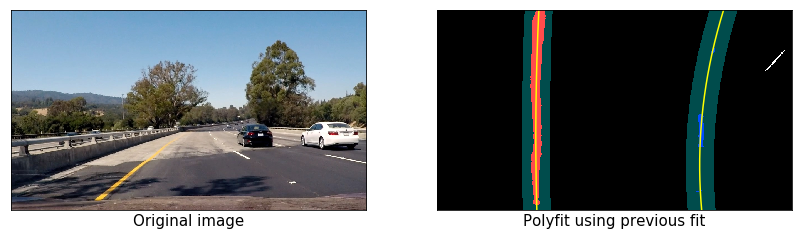

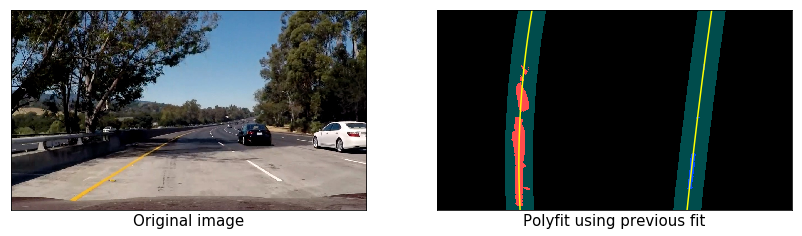

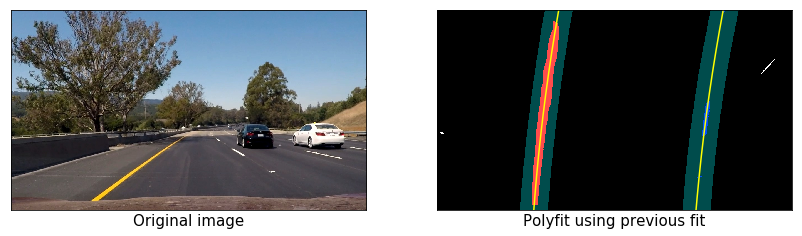

In [45]:
for original, processed in zip(test_images_imgs, test_images_processed):
    img = processed
    margin = 50
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualization_data = sliding_window(img)
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2 = polyfit_prev_fit(img, left_fit, right_fit)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fitx2 = left_fit2[0]*ploty**2 + left_fit2[1]*ploty + left_fit2[2]
    right_fitx2 = right_fit2[0]*ploty**2 + right_fit2[1]*ploty + right_fit2[2]
    out_img = np.uint8(np.dstack((img, img, img))*255)
    window_img = np.zeros_like(out_img)
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    out_img[nonzeroy[left_lane_inds2], nonzerox[left_lane_inds2]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds2], nonzerox[right_lane_inds2]] = [0, 0, 255]
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 255))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 255))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.figure(figsize=(14, 7))
    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.xlabel('Original image', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.xlabel('Polyfit using previous fit', fontsize=15)
    plt.plot(left_fitx2, ploty, color='yellow')
    plt.plot(right_fitx2, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

### Calculate Curvature of Road and Vehicle Position

> `curve_radius = ((1 + (2*fit[0]*y_0*y_meters_per_pixel + fit[1])**2)**1.5) / np.absolute(2*fit[0])`

In [46]:
def curve_pos(img, l_fit, r_fit, l_lane_inds, r_lane_inds):

    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature -Will choose max y-value corresponding to the bottom of the image
    h = img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist

Radius of Curvature:  668.9951702256709 m 660.633062137319 m
Distance from Lane Center -0.028743132077450027 m


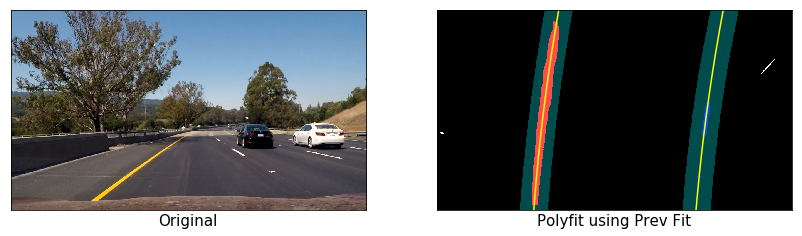

In [47]:
#Visualise curve pos for example img

rad_l, rad_r, d_center= curve_pos(test_images_processed[7], left_fit, right_fit, left_lane_inds2, right_lane_inds2)

print('Radius of Curvature: ', rad_l, 'm', rad_r, 'm')
print('Distance from Lane Center', d_center, 'm')
plt.figure(figsize=(14, 7))
plt.subplot(1,2,1)
plt.imshow(original)
plt.xlabel('Original', fontsize=15)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(result)
plt.xlabel('Polyfit using Prev Fit', fontsize=15)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)
plt.xticks([])
plt.yticks([])
plt.show()

Radius of Curvature: 1042.019831876258 m 1430.9186876183915 m
Distance from Lane Center: 0.37021550285439303 m


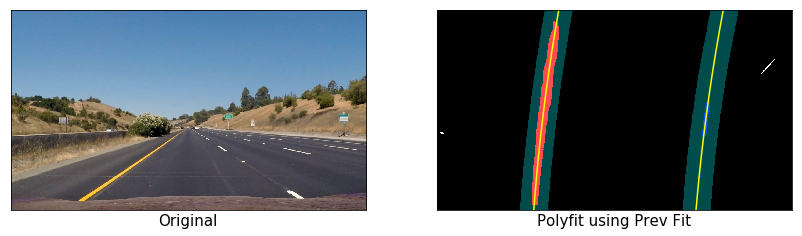

Radius of Curvature: 1836.363947536405 m 5311.341389726404 m
Distance from Lane Center: 0.3192750880231129 m


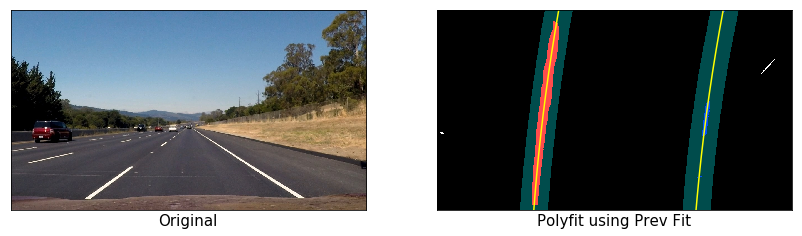

Radius of Curvature: 387.4164714451757 m 1453.7050368534944 m
Distance from Lane Center: 0.08603912571456004 m


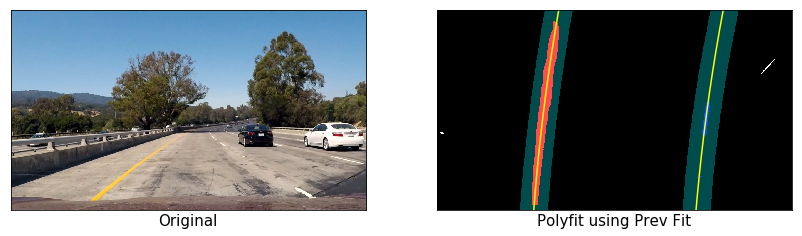

Radius of Curvature: 390.8945358543483 m 392.0881098263384 m
Distance from Lane Center: -0.3140515734175819 m


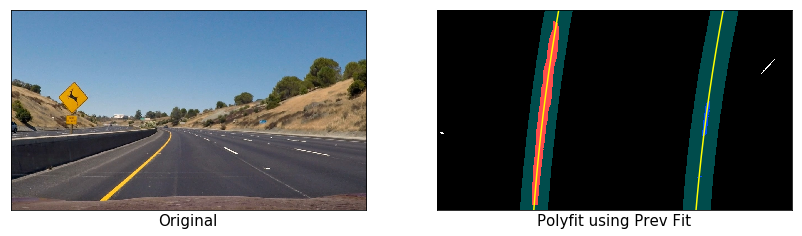

Radius of Curvature: 1029.956027694881 m 448.47339407770573 m
Distance from Lane Center: 0.18038437801886237 m


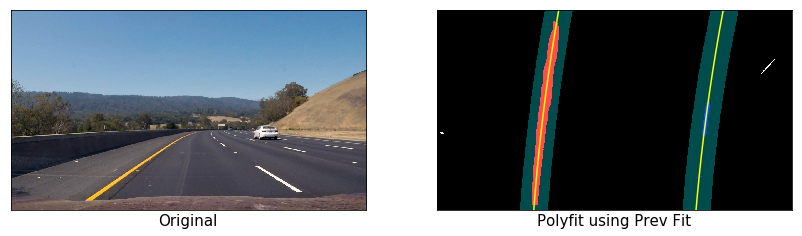

Radius of Curvature: 1086.8075611742847 m 172.34932358794825 m
Distance from Lane Center: -0.16915761427378131 m


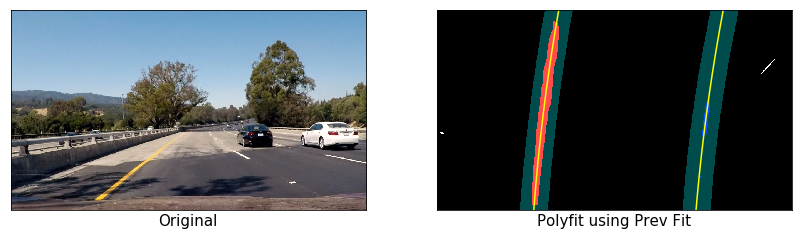

Radius of Curvature: 304.51574434938874 m 1832.850820266787 m
Distance from Lane Center: 0.3796531618892954 m


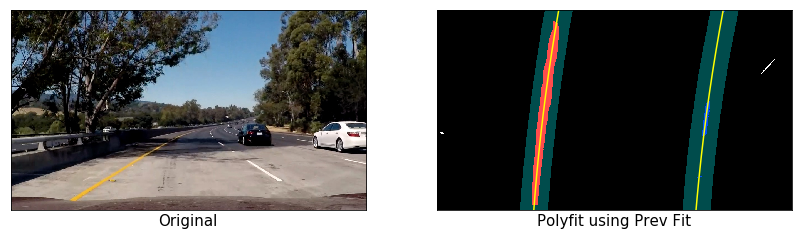

Radius of Curvature: 668.9951702256787 m 482.3560587967468 m
Distance from Lane Center: -0.028743132077450027 m


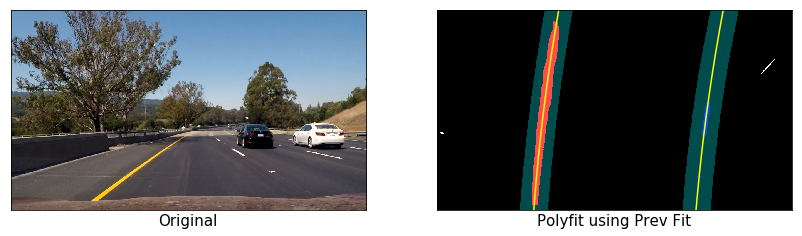

In [48]:
#Visualise curve pos on test imgs

for original, processed in zip(test_images_imgs, test_images_processed):
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data= sliding_window(processed)
    rad_l, rad_r, d_center= curve_pos(processed, left_fit, right_fit, left_lane_inds, right_lane_inds)
    print('Radius of Curvature:', rad_l, 'm', rad_r, 'm')
    print('Distance from Lane Center:', d_center, 'm')
    plt.figure(figsize=(14,7))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.xlabel('Original', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,2,2)
    plt.imshow(result)
    plt.xlabel('Polyfit using Prev Fit', fontsize=15)
    plt.plot(left_fitx2, ploty, color='yellow')
    plt.plot(right_fitx2, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

### Visual Display of the Lane Boundaries and Numerical Estimation of Lane Curvature and Vehicle Position

In [49]:
def draw_lane(original_image, binary_image, l_fit, r_fit, Minv):
    
    new_img= np.copy(original_image)
    if l_fit is None or r_fit is None:
        return original_image
    warp_zero= np.zeros_like(binary_image).astype(np.uint8)
    color_warp= np.dstack((warp_zero, warp_zero, warp_zero))
    h,w= binary_image.shape
    ploty= np.linspace(0, h-1, num=h)
    left_fitx= l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx= r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]
    pts_left= np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right= np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts= np.hstack((pts_left, pts_right))
    cv2.fillPoly(color_warp, np.int_([pts]), (255, 65, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0, 255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(100,155, 255), thickness=15)
    newwarp= cv2.warpPerspective(color_warp, Minv, (w, h))
    result= cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result

In [50]:
def write_data(original_img, curv_rad, center_dist):
    
    new_img= np.copy(original_img)
    h= new_img.shape[0]
    font= cv2.FONT_HERSHEY_DUPLEX
    text= 'Radius of Curvature: ' + '{:4.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40, 70), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    direction=''
    turn=''
    if center_dist > 0:
        direction='right'
        turn= ' Turn Slight Left'
    elif center_dist < 0:
        direction='left'
        turn= ' Turn Slight Right'
    abs_center_dist= abs(center_dist)
    text= '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40, 120), font, 1.5, (255, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(new_img, turn, (20, 170), font, 1.5, (255, 0, 0), 2, cv2.LINE_AA)
    return new_img

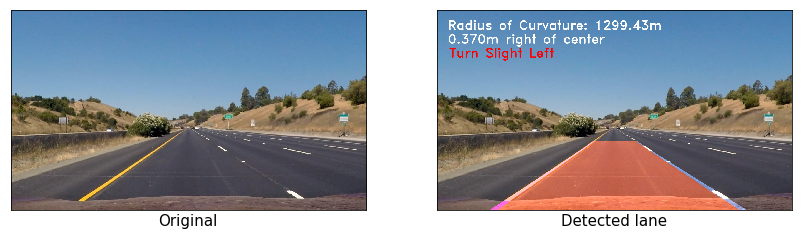

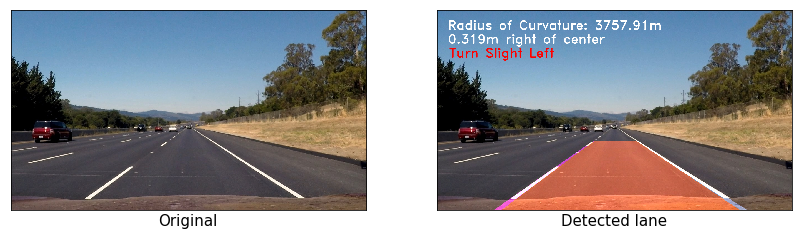

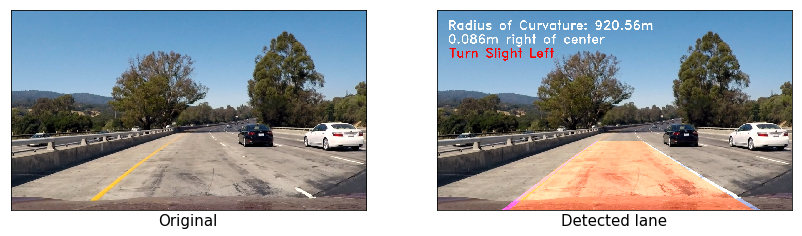

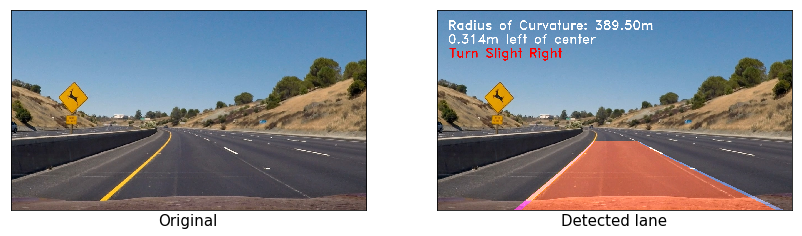

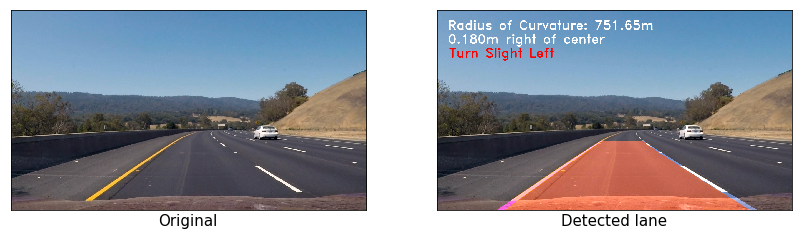

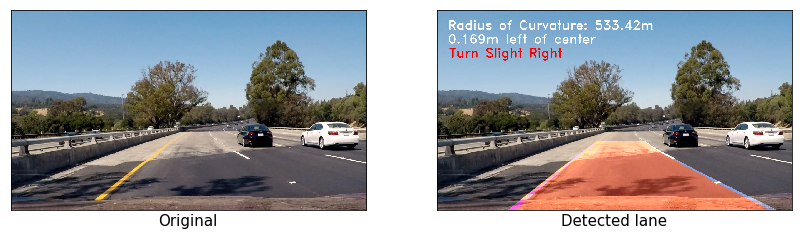

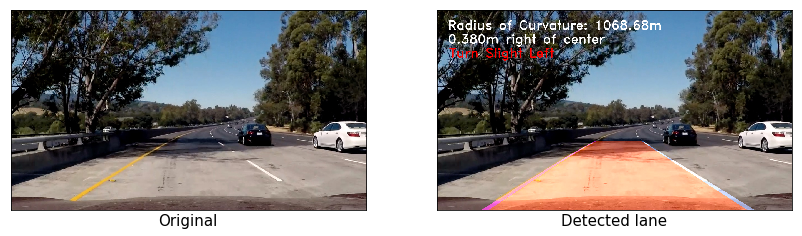

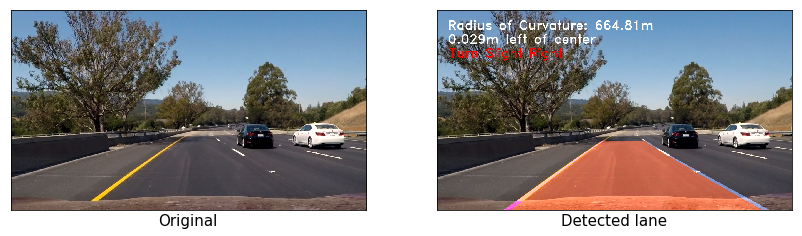

In [51]:
for original, processed in zip(test_images_imgs, test_images_processed):
    left_fit, right_fit, left_lane_inds, right_lane_inds, visualisation_data= sliding_window(processed)
    left_fit2, right_fit2, left_lane_inds2, right_lane_inds2= polyfit_prev_fit(processed, left_fit, right_fit)
    rad_l, rad_r, d_center= curve_pos(processed, left_fit, right_fit, left_lane_inds2, right_lane_inds2)
    result= draw_lane(original, processed, left_fit, right_fit, Minv)
    result= write_data(result, (rad_l+rad_r)/2, d_center)
    plt.figure(figsize=(14,7))
    plt.subplot(1,2,1)
    plt.imshow(original)
    plt.xlabel('Original', fontsize=15)
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,2,2)
    plt.imshow(result)
    plt.xlabel('Detected lane', fontsize=15)
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    plt.xticks([])
    plt.yticks([])
    plt.show()

### Process Videos 

In [52]:
class Line():
    
    def __init__(self):
        
        self.detected= False #to check line detection in last iteration
        self.recent_xfitted= [] #x values of the last n fits of the line
        self.bestx=None #average x values of the fitted line over last n iterations
        self.bestx_fit= None #polynomial coeffs of averaged over last n iterations
        self.current_fit= [] #polynomial coeffs  of the most recent fit
        self.radius_of_curvature= None #radius of curvature in the line of some units
        self.line_base_pos= None #distance in meters of vehicle center from the line
        self.diffs= np.array([0,0,0], dtype='float') #difference between last and new fit coeffs 
        self.px_count= None #number of detected pixels
    
    def add_fit(self, fit, inds):
        
        if fit is not None:
            self.detected= True
            self.px_count= np.count_nonzero(inds) 
            self.current_fit.append(fit)
            if len(self.current_fit) > 5:
                self.current_fit = self.current_fit[len(self.current_fit)-5:]
            self.best_fit= np.average(self.current_fit, axis=0)
        else:
            self.detected= False
            if len(self.current_fit) > 0:
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                self.best_fit= np.average(self.current_fit, axis=0)

In [53]:
def frame_processor(img):
    
    new_img = undistort(np.copy(img), mtx, dist)
    img_bin, Minv = image_process(img)
    if not l_line.detected or not r_line.detected:
        l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window(img_bin)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polyfit_prev_fit(img_bin, l_line.best_fit, r_line.best_fit)
        
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    img_out1 = draw_lane(new_img, img_bin, l_fit, r_fit, Minv)
    rad_l, rad_r, d_center = curve_pos(img_bin, l_fit, r_fit, l_lane_inds, r_lane_inds)
    img_out = write_data(img_out1, (rad_l+rad_r)/2, d_center)
    return img_out

### Processing The Videos

In [55]:
l_line= Line()
r_line= Line()
test_video_output='test_video_ouput1_v2.mp4'
test_video_input= VideoFileClip('C:/Users/soumyama/Documents/Python Scripts/Autonomous Car/Advanced-Lane-Finding-Using-OpenCV/project_video.mp4')
processed_video= test_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(test_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_video_output))

Moviepy - Building video test_video_ouput1_v2.mp4.
Moviepy - Writing video test_video_ouput1_v2.mp4



Moviepy - Done !
Moviepy - video ready test_video_ouput1_v2.mp4
Wall time: 2min 15s


In [56]:
l_line= Line()
r_line= Line()
test_video_output='test_video_ouput2.mp4'
test_video_input= VideoFileClip('C:/Users/soumyama/Documents/Python Scripts/Autonomous Car/Advanced-Lane-Finding-Using-OpenCV/challenge_video.mp4')
processed_video= test_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(test_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_video_output))

Moviepy - Building video test_video_ouput2.mp4.
Moviepy - Writing video test_video_ouput2.mp4



Moviepy - Done !
Moviepy - video ready test_video_ouput2.mp4
Wall time: 47.8 s


In [54]:
l_line= Line()
r_line= Line()
test_video_output='test_video_ouput3.mp4'
test_video_input= VideoFileClip('C:/Users/soumyama/Documents/Python Scripts/Autonomous Car/Advanced-Lane-Finding-Using-OpenCV/harder_challenge_video.mp4')
processed_video= test_video_input.fl_image(frame_processor)
%time processed_video.write_videofile(test_video_output, audio=False)

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_video_output))

Moviepy - Building video test_video_ouput3.mp4.
Moviepy - Writing video test_video_ouput3.mp4



Moviepy - Done !
Moviepy - video ready test_video_ouput3.mp4
Wall time: 2min 27s
